# Comparison of trajectories

We want to compare the trajectories of the standard trained model and the robust trained model

In [1]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
import matplotlib.pyplot as plt
import numpy as np

# Juptyer magic: For export. Makes the plots size right for the screen 
%matplotlib inline
# %config InlineBackend.figure_format = 'retina'

%config InlineBackend.figure_formats = ['svg'] 


torch.backends.cudnn.deterministic = True
seed = np.random.randint(1,200)
seed = 56
# torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
print(seed)
g = torch.Generator()
g.manual_seed(seed)

56



## Data preparation

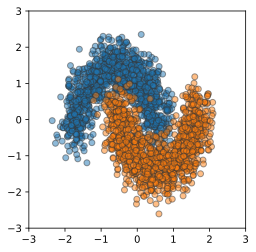

In [2]:
data_noise = 0.2
plotlim = [-3, 3]
subfolder = 'traj_comp_moons'


from models.training import create_dataloader
dataloader, dataloader_viz = create_dataloader('moons', noise = data_noise, plotlim = plotlim, random_state = seed)


## Model dynamics

In [3]:
#Import of the model dynamics that describe the neural ODE
#The dynamics are based on the torchdiffeq package, that implements ODE solvers in the pytorch setting
from models.neural_odes import NeuralODE

#for neural ODE based networks the network width is constant. In this example the input is 2 dimensional
hidden_dim, data_dim = 2, 2 
augment_dim = 0

#T is the end time of the neural ODE evolution, num_steps are the amount of discretization steps for the ODE solver
T, num_steps = 15, 15 
bound = 0.
fp = False #this recent change made things not work anymore
cross_entropy = True
turnpike = False

non_linearity = 'tanh' #'relu' #
architecture = 'inside' #outside


## Training and generating level sets

In [4]:

num_epochs = 120 #number of optimization runs in which the dataset is used for gradient decent
eps = 0.2

torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
anode = NeuralODE(device, data_dim, hidden_dim, augment_dim=augment_dim, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_anode = torch.optim.Adam(anode.parameters(), lr=1e-3) 

torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
rnode = NeuralODE(device, data_dim, hidden_dim, augment_dim=0, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_rnode = torch.optim.Adam(rnode.parameters(), lr=1e-3) 

In [5]:
from models.training import doublebackTrainer

trainer_anode = doublebackTrainer(anode, optimizer_anode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = 0) 
trainer_anode.train(dataloader, num_epochs)


Iteration 0/38
Loss: 0.430
Robust Term Loss: 0.000
Accuracy: 0.844

Iteration 10/38
Loss: 0.389
Robust Term Loss: 0.000
Accuracy: 0.875

Iteration 20/38
Loss: 0.528
Robust Term Loss: 0.000
Accuracy: 0.766

Iteration 30/38
Loss: 0.416
Robust Term Loss: 0.000
Accuracy: 0.828
Epoch 1: 0.388

Iteration 0/38
Loss: 0.297
Robust Term Loss: 0.000
Accuracy: 0.906

Iteration 10/38
Loss: 0.437
Robust Term Loss: 0.000
Accuracy: 0.781

Iteration 20/38
Loss: 0.272
Robust Term Loss: 0.000
Accuracy: 0.938

Iteration 30/38
Loss: 0.398
Robust Term Loss: 0.000
Accuracy: 0.844
Epoch 2: 0.324

Iteration 0/38
Loss: 0.308
Robust Term Loss: 0.000
Accuracy: 0.891

Iteration 10/38
Loss: 0.317
Robust Term Loss: 0.000
Accuracy: 0.891

Iteration 20/38
Loss: 0.268
Robust Term Loss: 0.000
Accuracy: 0.922

Iteration 30/38
Loss: 0.203
Robust Term Loss: 0.000
Accuracy: 0.953
Epoch 3: 0.297

Iteration 0/38
Loss: 0.269
Robust Term Loss: 0.000
Accuracy: 0.906

Iteration 10/38
Loss: 0.273
Robust Term Loss: 0.000
Accuracy:

In [6]:
#We are training the last linear layer for the standard model and then use the same for the robust model for better comparison   
w = anode.linear_layer.weight
b = anode.linear_layer.bias

print(w)
print(b)

rnode.linear_layer.weight = w
rnode.linear_layer.bias = b

rnode.linear_layer.requires_grad =  False

Parameter containing:
tensor([[-0.5422, -0.0986],
        [ 0.4619, -0.9430]], requires_grad=True)
Parameter containing:
tensor([-0.6724,  0.2593], requires_grad=True)


In [7]:
trainer_rnode = doublebackTrainer(rnode, optimizer_rnode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = eps) 
trainer_rnode.train(dataloader, num_epochs)

trainer_rnode = doublebackTrainer(rnode, optimizer_rnode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = eps + 0.2) 
trainer_rnode.train(dataloader, 20)


Iteration 0/38
Loss: 0.538
Robust Term Loss: 0.058
Accuracy: 0.797

Iteration 10/38
Loss: 0.279
Robust Term Loss: 0.030
Accuracy: 0.922

Iteration 20/38
Loss: 0.394
Robust Term Loss: 0.058
Accuracy: 0.797

Iteration 30/38
Loss: 0.344
Robust Term Loss: 0.045
Accuracy: 0.875
Epoch 1: 0.380

Iteration 0/38
Loss: 0.420
Robust Term Loss: 0.032
Accuracy: 0.828

Iteration 10/38
Loss: 0.265
Robust Term Loss: 0.040
Accuracy: 0.875

Iteration 20/38
Loss: 0.279
Robust Term Loss: 0.023
Accuracy: 0.859

Iteration 30/38
Loss: 0.277
Robust Term Loss: 0.030
Accuracy: 0.844
Epoch 2: 0.293

Iteration 0/38
Loss: 0.224
Robust Term Loss: 0.020
Accuracy: 0.891

Iteration 10/38
Loss: 0.279
Robust Term Loss: 0.026
Accuracy: 0.828

Iteration 20/38
Loss: 0.281
Robust Term Loss: 0.020
Accuracy: 0.844

Iteration 30/38
Loss: 0.200
Robust Term Loss: 0.027
Accuracy: 0.922
Epoch 3: 0.252

Iteration 0/38
Loss: 0.220
Robust Term Loss: 0.017
Accuracy: 0.906

Iteration 10/38
Loss: 0.256
Robust Term Loss: 0.024
Accuracy:

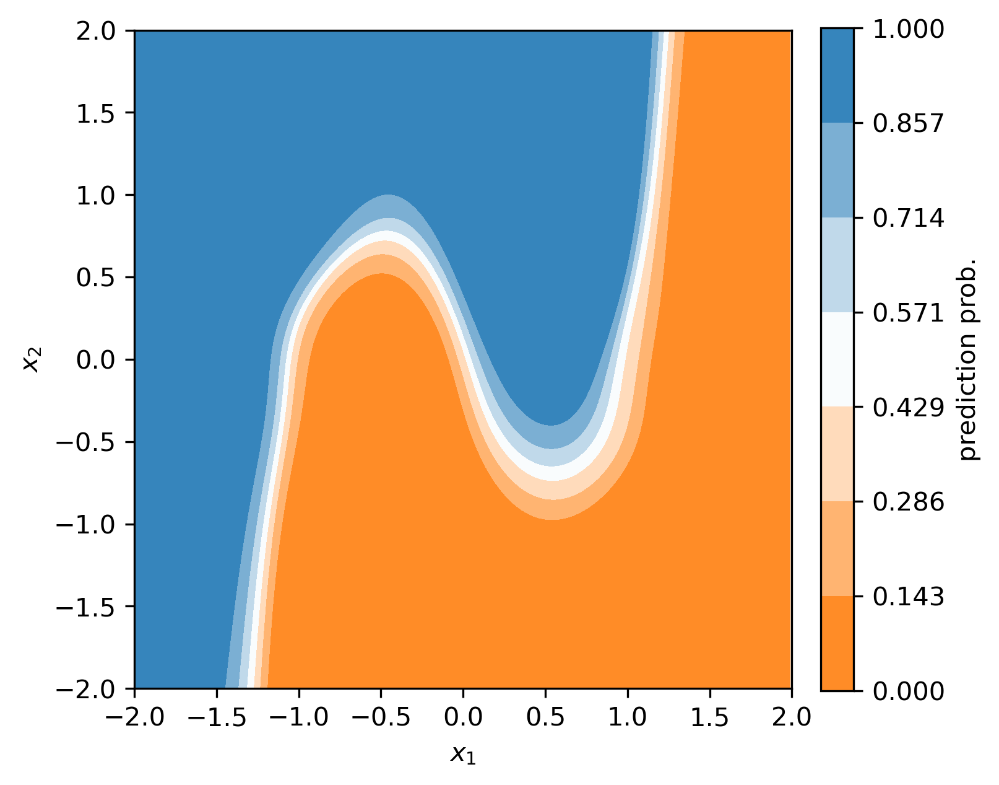

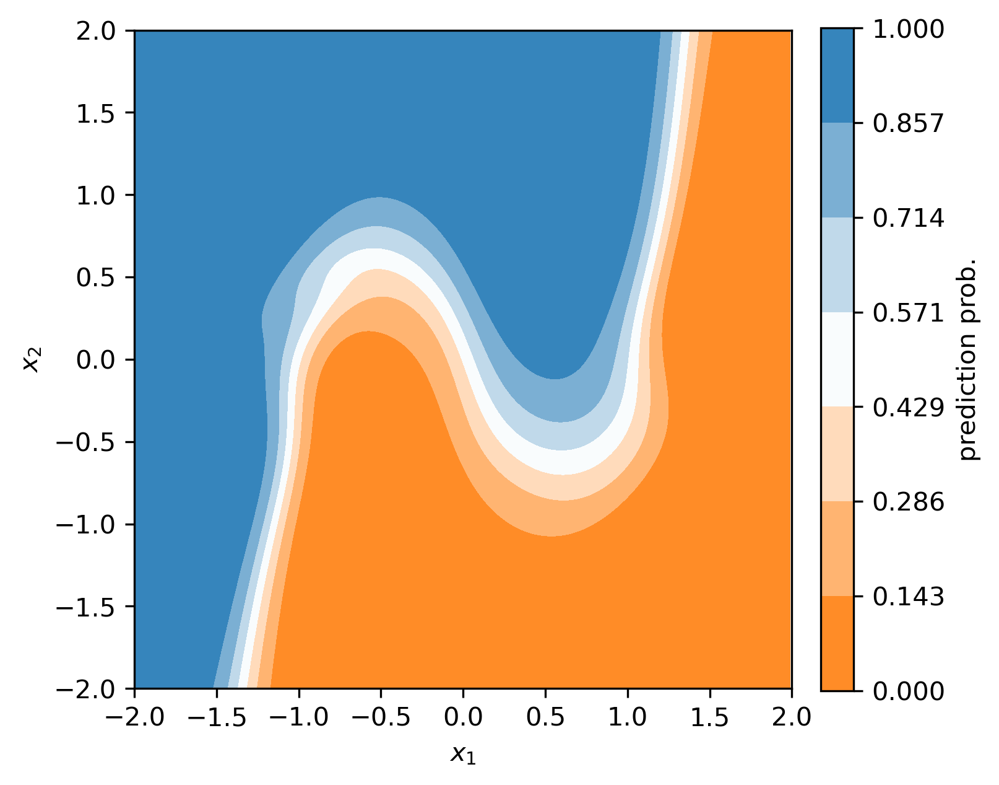

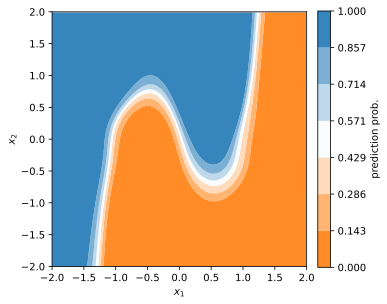

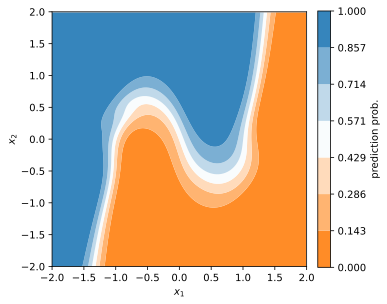

In [8]:
from plots.plots import classification_levelsets
import os

if not os.path.exists(subfolder):
        os.makedirs(subfolder)
        
fig_name_base = os.path.join(subfolder, 'levelsets')
classification_levelsets(anode, fig_name_base)
classification_levelsets(rnode, fig_name_base + '_rob')
from IPython.display import Image
img1 = Image(filename = fig_name_base + '.png', width = 400)
img2 = Image(filename = fig_name_base + '_rob.png', width = 400)

display(img1,img2)

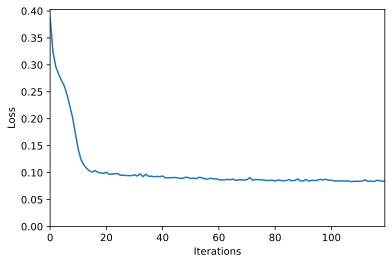

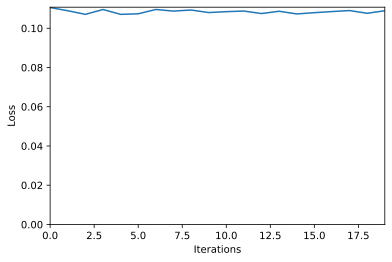

In [9]:
plt.plot(trainer_anode.histories['epoch_loss_history'])
plt.xlim(0, len(trainer_anode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

plt.plot(trainer_rnode.histories['epoch_loss_history'])
plt.xlim(0, len(trainer_rnode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [10]:
from numpy import arange
from torch import nn
from models.neural_odes import grad_loss_inputs

data_iter = iter(dataloader_viz)
X_viz, y_viz = next(data_iter) 


In [47]:

def find_attacks(model,X,y, adversarial_budget, result = 'success', attack_type = 'fgsm', return_corr_class_indices = False):
        """
        Takes point sample and finds successful attacks
        First filters out wrong classifications, then computes perturbations that are 
        """
        #check which points are correctly classified by model
        m = nn.Softmax(dim = 1)
        preds, _ = model(X)
        preds = m(preds)
        #the second entry gives the prediction probability that the label is orange
        preds = preds[:,1]
        #blue labels are 0, orange labels 1
        #if the probability is closer to the right label than the wrong, it is classified correctly by the model
        indices_corr_class = torch.abs(preds - y) < 0.5
        indices_wrong_class = torch.abs(preds - y) >= 0.5

        X_corr = X[indices_corr_class]
        X_wrong = X[indices_wrong_class]
        y_corr = y[indices_corr_class]
        y_wrong = y[indices_wrong_class]
        print('amount corr',len(X_corr))
        print('amount wrong',len(X_wrong))
        
        grad = grad_loss_inputs(model, X_corr, y_corr, trainer_anode.loss_func)
        if attack_type == 'fgsm':
                grad = torch.sgn(grad)
        if attack_type == 'l2':
                grad = torch.nn.functional.normalize(grad)
        grad = adversarial_budget * grad
        
        #successful attacks: perturb correctly classified points and check if the perturbed points are incorrectly classified
        X_attacks = X_corr + grad

        preds_attacks, _ = model(X_attacks)
        preds_attacks = m(preds_attacks)
        preds_attacks = preds_attacks[:,1]

        if result == 'success':
                indices = torch.abs(preds_attacks - y_corr) >= 0.5
        if result == 'fail':
                indices = torch.abs(preds_attacks - y_corr) < 0.5
                
        #successful attacks
        # X_attacks_success = X_attacks[indices]
        X_attacks_base = X_corr[indices]
        y_attacks = y_corr[indices]
        grad = grad[indices]
        print('amount attacks ' + result, len(X_attacks_base[:,0]))
        if return_corr_class_indices:
                return X_attacks_base, y_attacks, grad, indices_corr_class
        return X_attacks_base, y_attacks, grad


In [12]:
         
def viz_attack(points, labels, grad):
        """
        visualizes a given adversarial attack
        requires already drawn point samples and adds perturbation visuals
        
        input
        -points: the points that will be perturbed
        -labels: labels of all the points that are perturbed. 0 is blue, 1 is orange
        -grad: the perturbation directions for all points
        
        output
        Plot of arrows plus perturbed points with red highlighting
        """
        labels = labels.detach().numpy()
        points = points.detach().numpy()
        grad = grad.detach().numpy()
        
        attacks = points + grad
        
        #plot the perturbed points
        plt.scatter(attacks[labels == 0, 0], attacks[labels == 0, 1], edgecolor="#333", color = 'C0', zorder = 3)
        plt.scatter(attacks[labels == 1, 0], attacks[labels == 1, 1], edgecolor="#333", color = 'C1', zorder = 3)

        #plot the gradient to the perturbed points
        for i in range(len(attacks[:, 0])):
                plt.arrow(points[i, 0], points[i, 1], grad[i, 0], grad[i, 1],
                        head_width=0.05, head_length=0.1, fc='k', ec='k', alpha=0.5, length_includes_head = True, zorder = 2)
        #mark the perturbed points with red square
        plt.scatter(attacks[:, 0], attacks[:, 1], facecolor = 'none', s = 70, marker = 's', edgecolor="red", zorder = 2)

In [24]:
X_viz, y_viz = next(data_iter) 

amount corr 35
amount wrong 3
amount attacks success 6


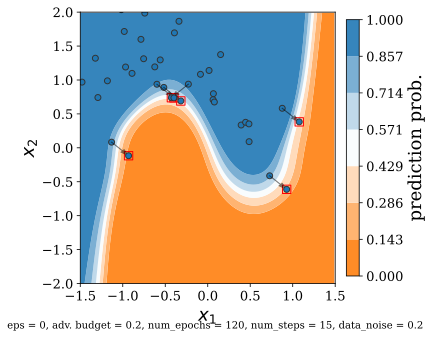

amount corr 35
amount wrong 0
amount attacks success 4


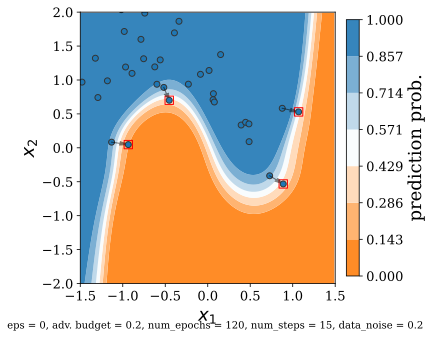

amount corr 35
amount wrong 0
amount attacks success 2


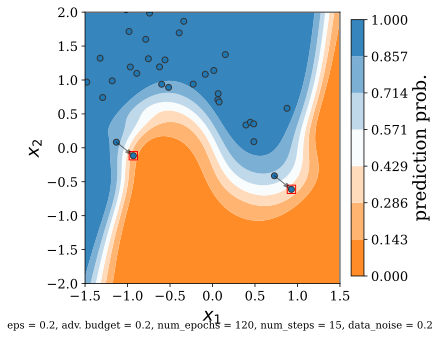

amount corr 35
amount wrong 0
amount attacks success 2


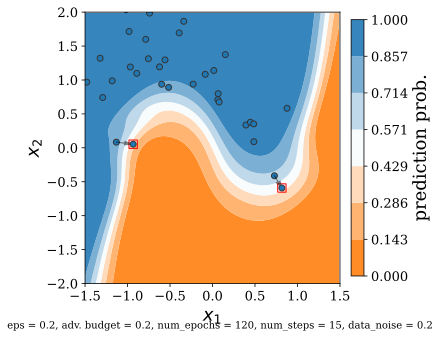

In [48]:
from plots.plots import visualize_classification, classification_levelsets
from torch.nn.functional import normalize

X_viz = X_viz[y_viz == 0]
y_viz = y_viz[y_viz == 0]
adversarial_budget = 0.2
footnote = f'adv. budget = {adversarial_budget}, {num_epochs = }, {num_steps = }, {data_noise = }'
x1lims = [-1.5,1.5]

X_attacks_base, y_attacks, grad, corr_pert_indices = find_attacks(anode, X_viz, y_viz, adversarial_budget, return_corr_class_indices =True)
X_viz = X_viz[corr_pert_indices]
y_viz = y_viz[corr_pert_indices]
visualize_classification(anode, X_viz, y_viz, footnote = 'eps = 0, ' + footnote, x1lims = x1lims)
viz_attack(X_attacks_base, y_attacks, grad)
plt.savefig('moon_attack_fgsm.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()

visualize_classification(anode, X_viz, y_viz, footnote = 'eps = 0, ' + footnote, x1lims = x1lims)
X_attacks_base, y_attacks, grad = find_attacks(anode, X_viz, y_viz, adversarial_budget, attack_type = 'l2')
viz_attack(X_attacks_base, y_attacks, grad)
plt.savefig('moon_attack_l2.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()

visualize_classification(rnode, X_viz, y_viz, footnote = f'{eps = }, ' + footnote, x1lims = x1lims)
X_attacks_base, y_attacks, grad = find_attacks(rnode, X_viz, y_viz, adversarial_budget)
viz_attack(X_attacks_base, y_attacks, grad)
plt.savefig('moon_rob_attack_fgsm.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()

visualize_classification(rnode, X_viz, y_viz, footnote = f'{eps = }, ' + footnote, x1lims = x1lims)
X_attacks_base, y_attacks, grad = find_attacks(rnode, X_viz, y_viz, adversarial_budget, attack_type = 'l2')
viz_attack(X_attacks_base, y_attacks, grad)
plt.savefig('moon_rob_attack_l2.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()
# visualize_classification(rnode, X_viz[y_viz == 0], y_viz[y_viz == 0])
# viz_attack(data_0_attacks_base, grad_0)

## Comparison plots level set attacks

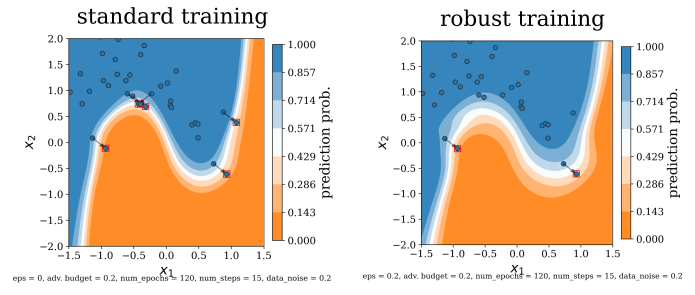

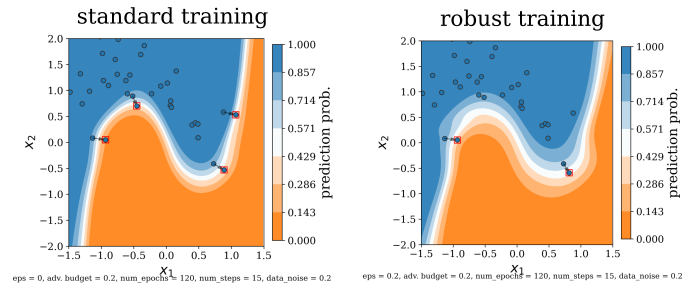

In [49]:
from plots.plots import comparison_plot
comparison_plot('moon_attack_fgsm.png', 'standard training', 'moon_rob_attack_fgsm.png', 'robust training', 'moon_fgsm_comp.png', show = True, figsize=(10,20), dpi = 300)
comparison_plot('moon_attack_l2.png', 'standard training', 'moon_rob_attack_l2.png', 'robust training', 'moon_l2_comp.png', show = True, figsize=(10,20), dpi = 300)

## Trajectory gif new

In [50]:
@torch.no_grad()
def trajectory_gif_new(model, inputs, targets, timesteps, dpi=200, alpha=0.9,
                   alpha_line=1, filename='trajectory.gif', axlim = 0, levels = 15):
    
    from matplotlib import rc
    from scipy.interpolate import interp1d
    from matplotlib.colors import to_rgb
    from matplotlib.colors import LinearSegmentedColormap
    rc("text", usetex = False)
    font = {'size'   : 18}
    rc('font', **font)

    if not filename.endswith(".gif"):
        raise RuntimeError("Name must end in with .gif, but ends with {}".format(filename))
    base_filename = filename[:-4]

    ## We focus on 3 colors at most
    if False in (t < 2 for t in targets): 
        color = ['mediumpurple' if targets[i] == 2.0 else 'gold' if targets[i] == 0.0 else 'mediumseagreen' for i in range(len(targets))]
    else:
        #color = ['crimson' if targets[i, 0] > 0.0 else 'dodgerblue' for i in range(len(targets))]
        color = ['C1' if targets[i] == 0 else 'C0' if targets[i] == 1 else 'darkgrey' for i in range(len(targets))]

    trajectories = model.flow.trajectory(inputs, timesteps).detach()
    num_dims = trajectories.shape[2]

    if axlim == 0:        
        x_min, x_max = trajectories[:, :, 0].min(), trajectories[:, :, 0].max()
        y_min, y_max = trajectories[:, :, 1].min(), trajectories[:, :, 1].max()
        
        margin = 0.1
        x_range = x_max - x_min
        y_range = y_max - y_min
        x_min -= margin * x_range
        x_max += margin * x_range
        y_min -= margin * y_range
        y_max += margin * y_range
    else: 
        x_min, x_max = -axlim, axlim  #to normalize for rob and standard nODE
        y_min, y_max = -axlim, axlim   #
        
    T = model.T 
    integration_time = torch.linspace(0.0, T, timesteps)
    
    interp_x = []
    interp_y = []
    interp_z = []
    for i in range(inputs.shape[0]):
        interp_x.append(interp1d(integration_time, trajectories[:, i, 0], kind='cubic', fill_value='extrapolate'))
        interp_y.append(interp1d(integration_time, trajectories[:, i, 1], kind='cubic', fill_value='extrapolate'))
        if num_dims == 3:
            interp_z.append(interp1d(integration_time, trajectories[:, i, 2], kind='cubic', fill_value='extrapolate'))
    
    interp_time = 20
    # interp_time = 3 #this was 5 before
    _time = torch.linspace(0., T, interp_time)

    plt.rc('grid', linestyle="dotted", color='lightgray')
    for t in range(interp_time):
        if num_dims == 2:
            fig = plt.figure(figsize=(5, 5), dpi=300)
            ax = fig.add_subplot(1, 1, 1)
            label_size = 13
            plt.rcParams['xtick.labelsize'] = label_size
            plt.rcParams['ytick.labelsize'] = label_size 
            ax.set_axisbelow(True)
            ax.xaxis.grid(color='lightgray', linestyle='dotted')
            ax.yaxis.grid(color='lightgray', linestyle='dotted')
            ax.set_facecolor('whitesmoke')
            
            plt.xlim(x_min, x_max)
            plt.ylim(y_min, y_max)
            plt.rc('text', usetex=False)
            plt.rc('font', family='serif')
            plt.xlabel(r'$x_1$', fontsize=12)
            plt.ylabel(r'$x_2$', fontsize=12)
            
            x1 = torch.arange(x_min, x_max, step=0.01, device=device)
            x2 = torch.arange(y_min, y_max, step=0.01, device=device)
            xx1, xx2 = torch.meshgrid(x1, x2)  # Meshgrid function as in numpy
            model_inputs = torch.stack([xx1, xx2], dim=-1)
            
            preds = model.linear_layer(model_inputs)
            
            # dim = 2 means that it normalizes along the last dimension, i.e. along the two predictions that are the model output
            m = nn.Softmax(dim=2)
            # softmax normalizes the model predictions to probabilities
            preds = m(preds)

            #we only need the probability for being in class1 (as prob for class2 is then 1- class1)
            preds = preds[:, :, 0]
            preds = preds.unsqueeze(2)  # adds a tensor dimension at position 2
            
            plt.grid(False)
    

            ax = plt.gca()
            ax.set_aspect('equal') 
            
            
            colors = [to_rgb("C1"), [1, 1, 1], to_rgb("C0")] # first color is orange, last is blue
            cm = LinearSegmentedColormap.from_list(
                "Custom", colors, N=40)
            z = np.array(preds).reshape(xx1.shape)
            
            levels_range = np.linspace(0.,1.,levels).tolist()
            
            cont = plt.contourf(xx1, xx2, z, levels_range, alpha=0.5, cmap=cm, zorder = 0, extent=(x_min, x_max, y_min, y_max)) #plt.get_cmap('coolwarm')
            cbar = fig.colorbar(cont, fraction=0.046, pad=0.04)
            cbar.ax.set_ylabel('prediction prob.')
            
            
            
            
            plt.scatter([x(_time)[t] for x in interp_x], 
                         [y(_time)[t] for y in interp_y], 
                         c=color, alpha=alpha, marker = 'o', linewidth=0.65, edgecolors='black', zorder=3)

            if t > 0:
                for i in range(inputs.shape[0]):
                    x_traj = interp_x[i](_time)[:t+1]
                    y_traj = interp_y[i](_time)[:t+1]
                    plt.plot(x_traj, y_traj, c=color[i], alpha=alpha_line, linewidth = 0.75, zorder=1)
            
        
        ax.set_aspect('equal')

        plt.savefig(base_filename + "{}.png".format(t),
                    format='png', dpi=dpi, bbox_inches='tight', facecolor = 'white')
        # Save only 3 frames (.pdf for paper)
        # if t in [0, interp_time//5, interp_time//2, interp_time-1]:
        #     plt.savefig(base_filename + "{}.pdf".format(t), format='pdf', bbox_inches='tight')
        plt.clf()
        plt.close()

    imgs = []
    for i in range(interp_time):
        img_file = base_filename + "{}.png".format(i)
        imgs.append(imageio.imread(img_file))
        if i not in [0, interp_time//5, interp_time//2, interp_time-1]: os.remove(img_file) 
    imageio.mimwrite(filename, imgs, fps = 2)

In [64]:
# print(y_viz.type())
X_attacks_base, y_attacks, grad = find_attacks(anode, X_viz, y_viz, adversarial_budget)
X_attacks_defended, y_attacks_def, grad_def = find_attacks(rnode, X_attacks_base, y_attacks, adversarial_budget, result = 'fail')

X_for_gif = X_attacks_defended
y_for_gif = y_attacks_def
grad_for_gif = grad_def

# X_attacks_base = X_attacks_base.tolist()
# X_attacks_defended = X_attacks_defended.tolist()
# y_attacks = y_attacks.tolist()
# grad = grad.tolist()

# # print(X_attacks_base)

# X_for_gif = []
# y_for_gif = []
# grad_for_gif = []

# for point, label, grad_point in zip(X_attacks_base, y_attacks, grad):
#     if point in X_attacks_defended:
#         X_for_gif.append(point)
#         y_for_gif.append(label)
#         grad_for_gif.append(grad_point)

print(X_for_gif)
print(y_for_gif)
print(grad_for_gif)


amount corr 35
amount wrong 0
amount attacks success 6
amount corr 6
amount wrong 0
amount attacks fail 4
tensor([[-0.5169,  0.8907],
        [-0.2279,  0.9385],
        [ 0.8767,  0.5827],
        [-0.5980,  0.9369]])
tensor([0, 0, 0, 0])
tensor([[-0.2000, -0.2000],
        [-0.2000, -0.2000],
        [ 0.2000, -0.2000],
        [ 0.2000, -0.2000]])


## Trajectory changes

In [65]:

import imageio
import os

# X_for_gif = torch.Tensor(X_for_gif)
# y_for_gif = torch.Tensor(y_for_gif)
# grad_for_gif = torch.Tensor(grad_for_gif)

X = X_for_gif[0:1]
y = y_for_gif[0:1]
print(y)
grad = grad_for_gif[0:1]

X_pert = X + grad


tensor([0])


In [66]:

axlim = 6
levels = 7

trajectory_gif_new(anode, X, y, timesteps=num_steps, filename = 'trajectory.gif', axlim = 6, dpi = 100, levels = levels)
trajectory_gif_new(rnode, X, y, timesteps=num_steps, filename = 'trajectory_db.gif', axlim = 6, dpi = 100, levels = levels)

trajectory_gif_new(anode, X_pert, y, timesteps=num_steps, filename = 'trajectory_pert.gif', axlim = 6, dpi = 100, levels = levels)
trajectory_gif_new(rnode, X_pert, y, timesteps=num_steps, filename = 'trajectory_pert_db.gif', axlim = 6, dpi = 100, levels = levels)


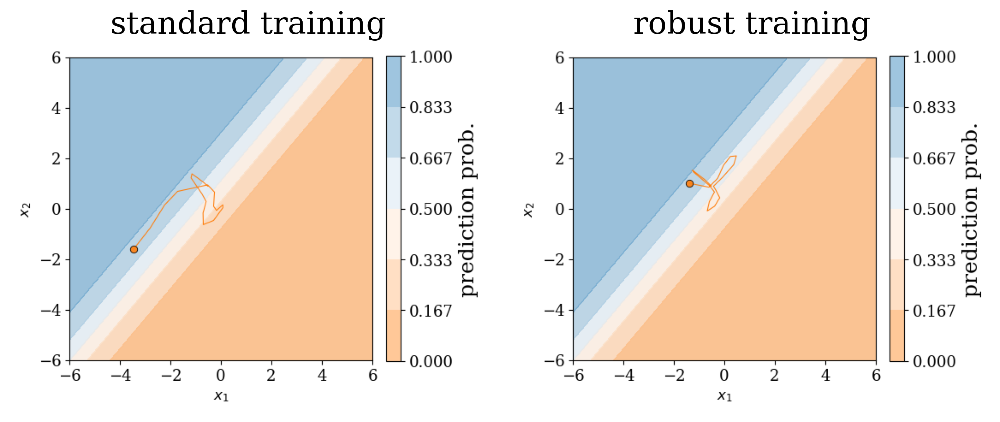

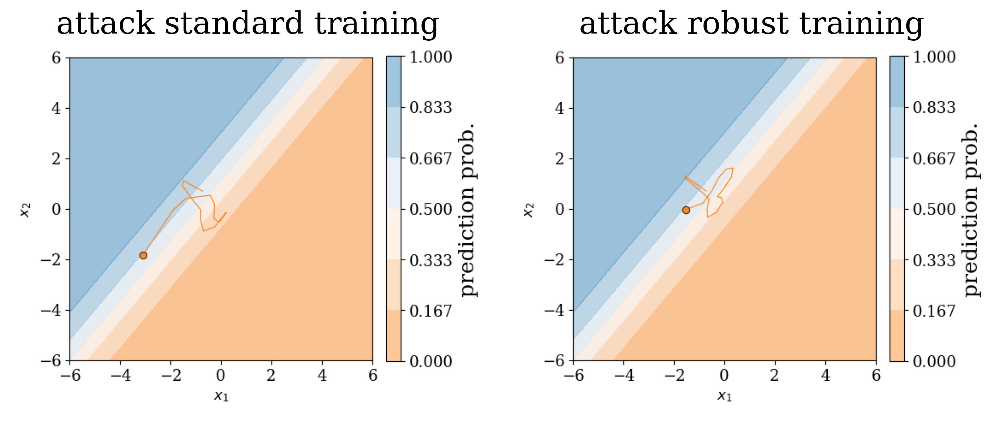

In [67]:

comparison_plot("trajectory19.png", 'standard training', "trajectory_db19.png", 'robust training', 'traj_comp.png', figsize=(10,20), dpi = 300)
display(Image('traj_comp.png', width = 800))

comparison_plot("trajectory_pert19.png", 'attack standard training', "trajectory_pert_db19.png", 'attack robust training', 'traj_comp_pert.png', figsize=(10,20), dpi = 300)
display(Image('traj_comp_pert.png', width = 800))


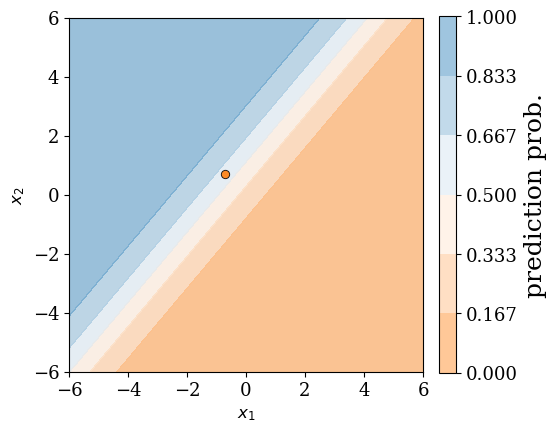

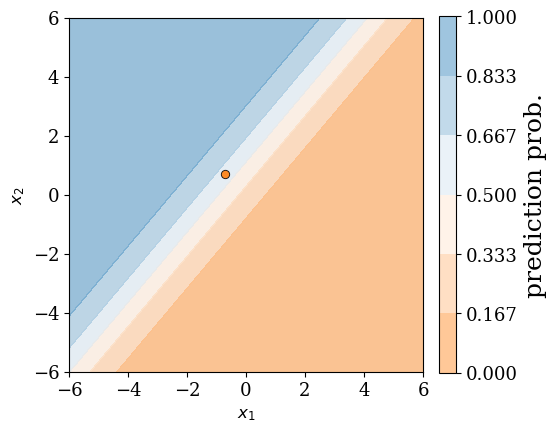

In [68]:

#Display of the generated gif
traj = Image(filename="trajectory_pert.gif")
rtraj = Image(filename="trajectory_pert_db.gif")
display(traj, rtraj)

In [55]:

#the function trajectory_gif creates the evolution trajectories of the input data through the network
#the passing time corresponds to the depth of the network

data_iter = iter(dataloader)
X,y = next(data_iter)
batch_size = 20

X_test = torch.zeros_like(X[0:batch_size])
y_test = torch.zeros(batch_size, dtype = torch.int64) + (-1)
print(y_test == 0)
# print(y_test.size())
# print(X_test.size())
X_test[:,1] = torch.linspace(-3,3,batch_size)
X_test[:,0] = torch.tensor([0])
# print(X_test)

# plt.scatter(X_test[:,0],X_test[:,1])


tensor([False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False])


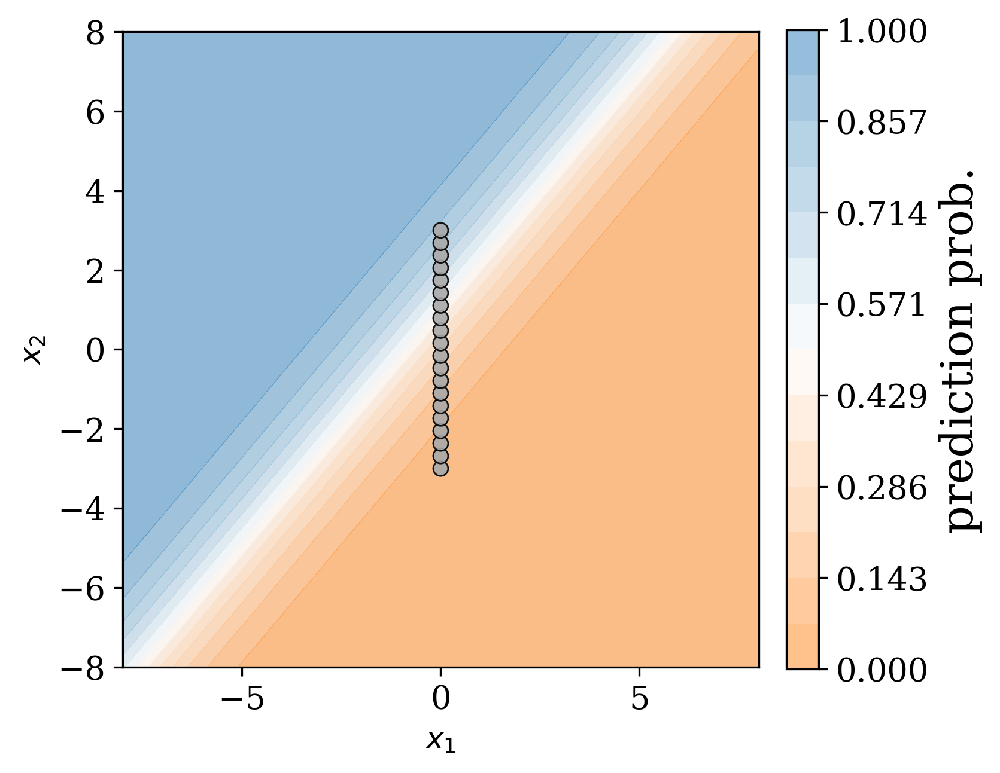

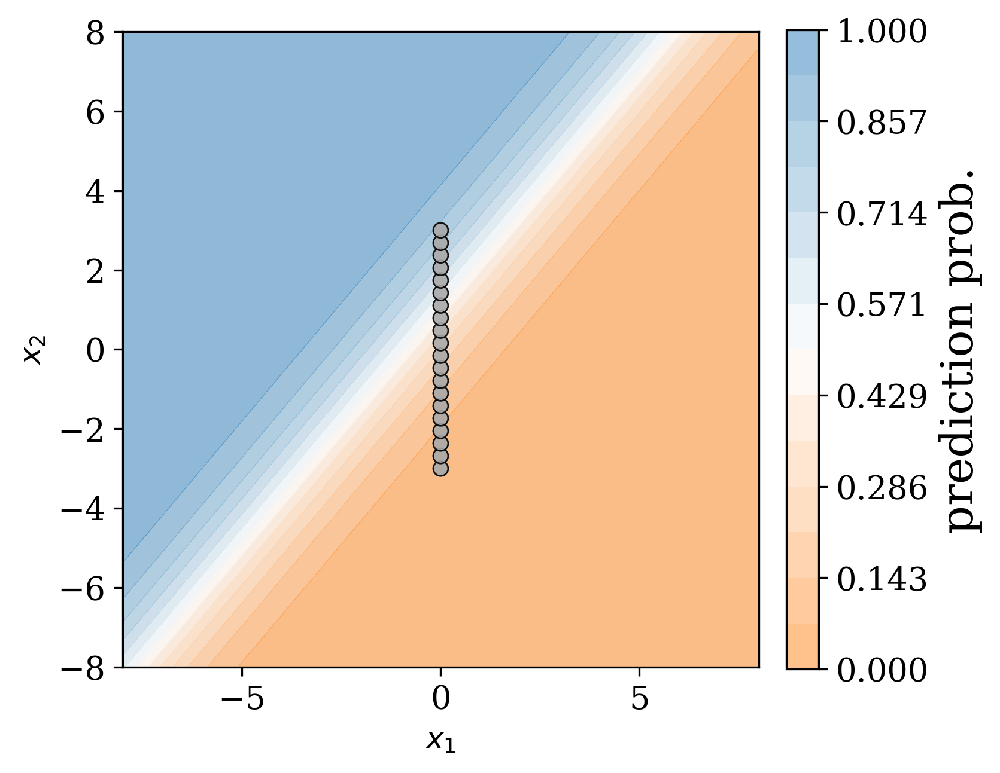

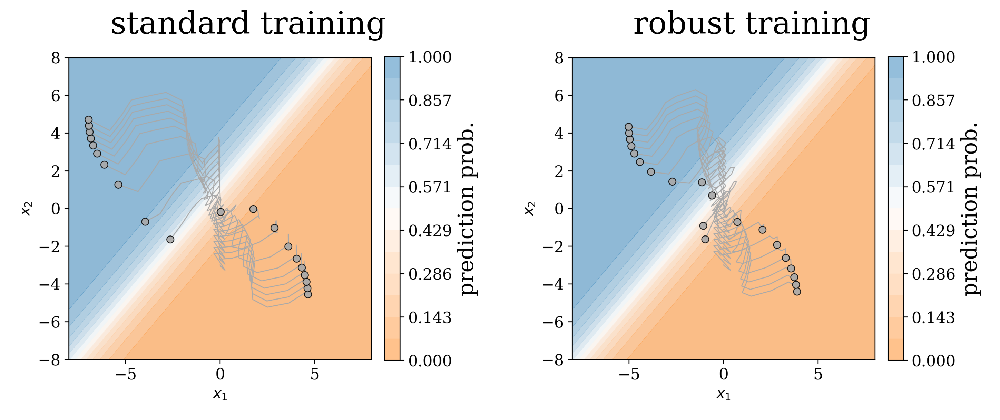

In [56]:


trajectory_gif_new(anode, X_test[0:batch_size], y_test[0:batch_size], timesteps=num_steps, filename = 'trajectory.gif', axlim = 8, dpi = 300)
trajectory_gif_new(rnode, X_test[0:batch_size], y_test[0:batch_size], timesteps=num_steps, filename = 'trajectory_db.gif', axlim = 8, dpi = 300)
# break

# #Display of the generated gif
traj = Image(filename="trajectory.gif", width = 800)
rtraj = Image(filename="trajectory_db.gif", width = 800)
display(traj, rtraj)

comparison_plot("trajectory19.png", 'standard training', "trajectory_db19.png", 'robust training', 'traj_comp.png', figsize=(10,20), dpi = 300)
display(Image('traj_comp.png', width = 800))